# Superpixel Clustering using SLIC (Simple Linear Iterarive Clustering).
<!-- Understanding and implementing SLIC Superpixels. -->
A superpixel can be defined as a group of pixels that share common characteristics. Simple Linear Iterative Clustering (SLIC) generates superpixels by clustering pixels based on their color similarity and proximity in the image plane. The purpose of this assignment is to understand and implement SLIC Superpixels.


Let's download the dataset first.

In [ ]:
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip

--2020-11-03 03:35:03--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 173.222.228.51, 2600:1409:12:285::e59, 2600:1409:12:2af::e59
Connecting to download.microsoft.com (download.microsoft.com)|173.222.228.51|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M   110MB/s    in 0.4s    

2020-11-03 03:35:04 (110 MB/s) - ‘msrc_objcategimagedatabase_v1.zip’ saved [44119839/44119839]



In [ ]:
!unzip --qq msrc_objcategimagedatabase_v1.zip

We only focus on six images in this assignment.

In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

In [ ]:
#All important functions to plot, do not modify this block
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im,title,xticks=[],yticks= [],isCv2 = True):
    """
    im :Image to plot
    title : Title of image 
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing 
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm), 
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value  
    
    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot 
    
    Output: None
    Creates a plot    
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]
    
    plot_image(seg_img,title)
    
    return    

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust} 
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot: 
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the 
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

Let's see what the six images are:

In [ ]:
#for i in im_list:
#    plot_image(cv2.imread(i),i.split("/")[-1])

Get image and visualize it. Its a scenery with 3 elements. You can see the segmentation ground truth in the GT bitmap.  

### K-means on RGB
We know k-means clustering algorithm. It is an unsupervised algorithm which minimizes
__L2norm/ Euclidean distances in a way such that it maximizes the intra-cluster similarity and minimizes the inter-cluster similarity.__  

Complete the pixel clustering function. It should take input an image (dim = (n $\times$ m  $\times$ 3)) and number of clusters needed. 
Does K means clustering work on image pixels?
Let the number of clusters be K = 5, 10, 50




In [ ]:
im = cv2.imread(im_list[0])
seg = cv2.imread(im_list[0].replace("_s","_s_GT"))

#plot_image(im,"Image")
#plot_image(seg,"Segmentation")


In [ ]:
import math
class Cluster:
    def __init__(self, color_center, xy_center):
        self.color_center = color_center
        self.xy_center = xy_center
        self.center = np.append(color_center, xy_center)
        self.points = []

        
class Pixel:
    def __init__(self, color, pos):
        self.color = color
        self.pos = pos

In [ ]:
def distance(p1, p2):
    return np.linalg.norm(p1-p2)


def weighted_distance(p1, p2, clr_wt, pos_wt):
    color_dist = distance(p1.color, p2.color)
    xy_dist = distance(p1.pos, p2.pos)
    
    dist = (clr_wt * color_dist**2 + pos_wt * xy_dist**2)**0.5
    return dist


'''
This function gives us the index of the nearest cluster in the RGBXY space :
For naive K-Means i.e for 3D RGB vector spapce:  clr_wt=1, pos_wt=0 - So we are not taking into account the xy distance
For K-Means with 5D vector space - RGBXY space: clr_wt=1, pos_wt=1 - We are giving equal weightage to RGB and XY vector spaces
For Weighted K-Means with 5D vector space we can vary the values of clr_wt and pos_wt as per the values of lambda1 and lambda2 passed in the function

This way We have made a generic K-Means algorithm in terms of the distance metric 
'''

def get_closest_cluster_ind(im, pixel, clusters, cluster_vec_list, clr_wt, pos_wt):
    min_dist = math.inf
    min_ind = 0

    pix_vec = np.append(pixel.color, pixel.pos)

    diff = cluster_vec_list - pix_vec  #finding the difference between the vectors collectively
    
    color_norm = np.linalg.norm(diff[:, :3], axis=1)  # separating the RGB and XY vector spaces
    xy_norm = np.linalg.norm(diff[:, 3:], axis=1)


    wt_color_dist = clr_wt*color_norm**2   # weighted distance 
    wt_xy_dist = pos_wt*xy_norm**2
    total_dist = (wt_color_dist + wt_xy_dist)**0.5

    min_ind = np.argmin(total_dist)
    return min_ind



def assign_clusters(im, seg_map, clusters, cluster_vec_list, clr_wt, pos_wt):
    h = im.shape[0]
    w = im.shape[1]
    for i in range(h):
        for j in range(w):
            pixel_color = im[i,j]
            curr_pixel = Pixel(pixel_color, np.array([i,j]))
            
            closest_cluster_ind = get_closest_cluster_ind(im, curr_pixel, clusters, cluster_vec_list, clr_wt, pos_wt)
            
            pix_vec = np.append(pixel_color, [i,j])
            clusters[closest_cluster_ind].points.append(pix_vec)
            
            seg_map[i,j] = closest_cluster_ind + 1




In [ ]:
def get_init_centroids(im, num_centroids, loc_req=False):
    cluster_list = []
    cluster_vec_list = []
    for i in range(num_centroids):
        point = (np.random.randint(0, im.shape[0]), np.random.randint(0, im.shape[1]))
        pixel = im[point]
        cluster = Cluster(pixel, np.array(point))
        cluster_list.append(cluster)
        cluster_vec_list.append(np.append(pixel, point))

    return cluster_list, np.array(cluster_vec_list)

In [ ]:
def adjust_cluster_centroids(clusters, cluster_vec_list):
    for i, cluster in enumerate(clusters):
        points = cluster.points
        if len(points) > 0:
            mean_val = np.mean(points, axis=0)
            cluster.color_center = mean_val[:3]  # mean value in RGB space
            cluster.xy_center = mean_val[3:]  # mean value in XY space
            cluster.center = mean_val        
            cluster_vec_list[i] = mean_val  
            cluster.points = []


def is_converged(new_cluster_centers, old_cluster_centers, threshold=5):
    if len(new_cluster_centers) == 0 or len(old_cluster_centers) == 0:
        return False 
    #'''
    new_cluster_centers = np.array(new_cluster_centers)
    old_cluster_centers = np.array(old_cluster_centers)
    shift = np.linalg.norm(new_cluster_centers - old_cluster_centers, axis=1).sum()
    return shift <= threshold
    #'''
    #return False
        

In [ ]:
def kmeans(im, k, clr_wt, pos_wt, num_iteration=10):
    
    cluster_centers = []
    old_cluster_centers = []
    seg_map = -1 * np.ones((im.shape[0], im.shape[1]))
    
    clusters, cluster_vec_list = get_init_centroids(im, num_centroids=k)
    itr = 0
    while not is_converged(cluster_centers, old_cluster_centers) and itr < num_iteration:
        old_cluster_centers = []#[c.center for c in clusters]
        
        assign_clusters(im, seg_map, clusters, cluster_vec_list, clr_wt=clr_wt, pos_wt=pos_wt)
        adjust_cluster_centroids(clusters, cluster_vec_list)
        
        new_cluster_centers = []#[c.center for c in clusters]
        
        itr += 1
        print('===========<< Clusters: ', k, ': Iteration: ', itr, ' complete >>===========')
        
    return seg_map

===========<< Clusters:  5 : Iteration:  1  complete >>===========
===========<< Clusters:  5 : Iteration:  2  complete >>===========
===========<< Clusters:  5 : Iteration:  3  complete >>===========
===========<< Clusters:  5 : Iteration:  4  complete >>===========
===========<< Clusters:  5 : Iteration:  5  complete >>===========
===========<< Clusters:  5 : Iteration:  6  complete >>===========
===========<< Clusters:  5 : Iteration:  7  complete >>===========
===========<< Clusters:  5 : Iteration:  8  complete >>===========
===========<< Clusters:  5 : Iteration:  9  complete >>===========
===========<< Clusters:  5 : Iteration:  10  complete >>===========
===========<< Clusters:  10 : Iteration:  1  complete >>===========
===========<< Clusters:  10 : Iteration:  2  complete >>===========
===========<< Clusters:  10 : Iteration:  3  complete >>===========
===========<< Clusters:  10 : Iteration:  4  complete >>===========
===========<< Clusters:  10 : Iteration:  5  complete >>=

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


===========<< Clusters:  50 : Iteration:  1  complete >>===========
===========<< Clusters:  50 : Iteration:  2  complete >>===========
===========<< Clusters:  50 : Iteration:  3  complete >>===========
===========<< Clusters:  50 : Iteration:  4  complete >>===========
===========<< Clusters:  50 : Iteration:  5  complete >>===========
===========<< Clusters:  50 : Iteration:  6  complete >>===========
===========<< Clusters:  50 : Iteration:  7  complete >>===========
===========<< Clusters:  50 : Iteration:  8  complete >>===========
===========<< Clusters:  50 : Iteration:  9  complete >>===========
===========<< Clusters:  50 : Iteration:  10  complete >>===========
===========<< Clusters:  5 : Iteration:  1  complete >>===========
===========<< Clusters:  5 : Iteration:  2  complete >>===========
===========<< Clusters:  5 : Iteration:  3  complete >>===========
===========<< Clusters:  5 : Iteration:  4  complete >>===========
===========<< Clusters:  5 : Iteration:  5  complet

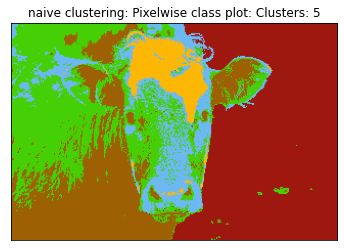

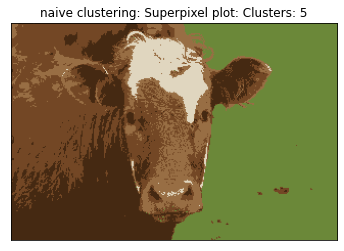

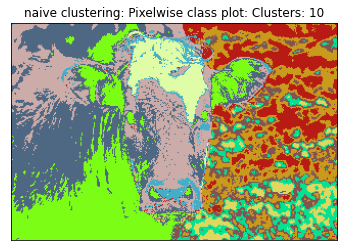

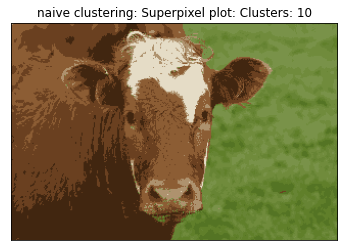

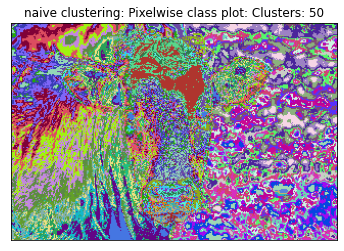

...

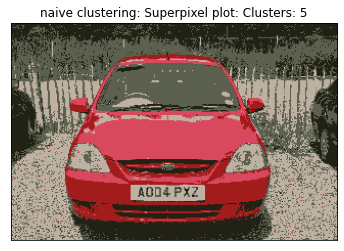

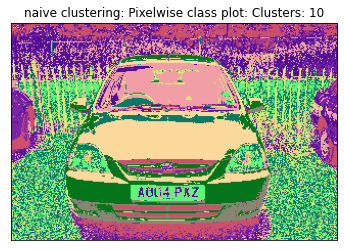

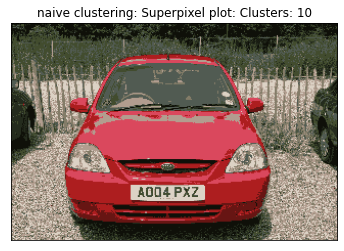

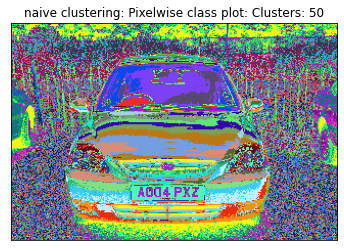

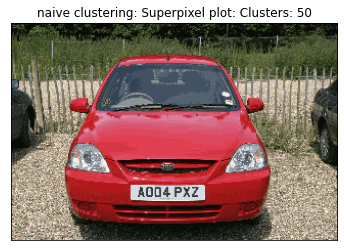

In [ ]:
from sklearn.cluster import KMeans
import numpy as  np
def cluster_pixels(im,k):    
    #TODO Pixelwise clustering   

    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel
    segmap = kmeans(im, k, clr_wt=1, pos_wt=0)

    return segmap


for im_name in im_list:
  im = cv2.imread(im_name)
  for k in [5,10,50]:
      clusters = cluster_pixels(im,k)
      _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
      superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

###Question 2: Now that you have a function handy, we have a slightly complex task

Instead of making clustering run on RGB space, run the clustering on RGBXY space. What advantages does that give us? 
(try with clusters = 5, 10, 25, 50, 150)

===========<< Clusters:  20 : Iteration:  1  complete >>===========
===========<< Clusters:  20 : Iteration:  2  complete >>===========
===========<< Clusters:  20 : Iteration:  3  complete >>===========
===========<< Clusters:  20 : Iteration:  4  complete >>===========
===========<< Clusters:  20 : Iteration:  5  complete >>===========
===========<< Clusters:  20 : Iteration:  6  complete >>===========
===========<< Clusters:  20 : Iteration:  7  complete >>===========
===========<< Clusters:  20 : Iteration:  8  complete >>===========
===========<< Clusters:  20 : Iteration:  9  complete >>===========
===========<< Clusters:  20 : Iteration:  10  complete >>===========
===========<< Clusters:  80 : Iteration:  1  complete >>===========
===========<< Clusters:  80 : Iteration:  2  complete >>===========
===========<< Clusters:  80 : Iteration:  3  complete >>===========
===========<< Clusters:  80 : Iteration:  4  complete >>===========
===========<< Clusters:  80 : Iteration:  5  co

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


===========<< Clusters:  80 : Iteration:  1  complete >>===========
===========<< Clusters:  80 : Iteration:  2  complete >>===========
===========<< Clusters:  80 : Iteration:  3  complete >>===========
===========<< Clusters:  80 : Iteration:  4  complete >>===========
===========<< Clusters:  80 : Iteration:  5  complete >>===========
===========<< Clusters:  80 : Iteration:  6  complete >>===========
===========<< Clusters:  80 : Iteration:  7  complete >>===========
===========<< Clusters:  80 : Iteration:  8  complete >>===========
===========<< Clusters:  80 : Iteration:  9  complete >>===========
===========<< Clusters:  80 : Iteration:  10  complete >>===========
===========<< Clusters:  200 : Iteration:  1  complete >>===========
===========<< Clusters:  200 : Iteration:  2  complete >>===========
===========<< Clusters:  200 : Iteration:  3  complete >>===========
===========<< Clusters:  200 : Iteration:  4  complete >>===========
===========<< Clusters:  200 : Iteration:  

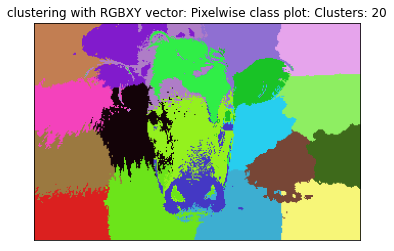

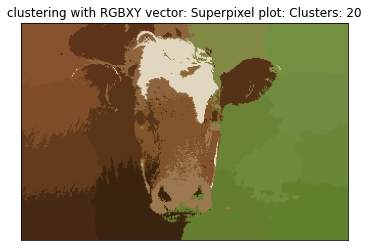

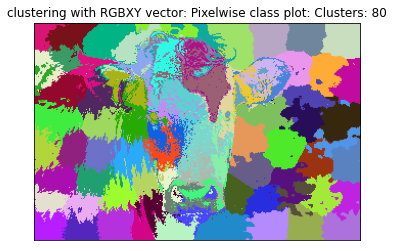

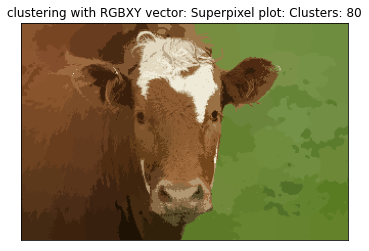

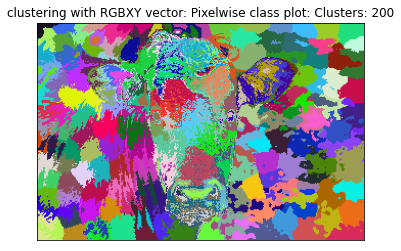

...

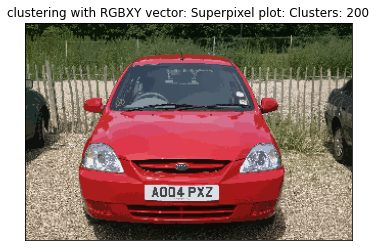

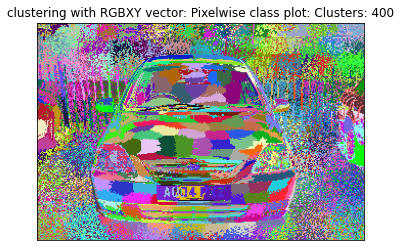

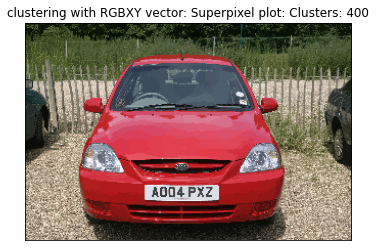

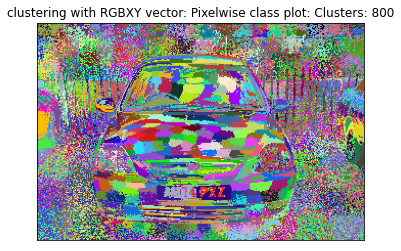

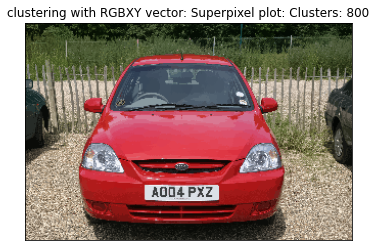

In [ ]:
#TODO: clustering r,b,g,x,y values 
#try k = 20,80,200,400,800

def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    #assert 1==2,"NOT IMPLEMENTED"
    # giving equal weight to the position of the pixels too 
    segmap = kmeans(im, k, clr_wt=1, pos_wt=1, num_iteration=10)
    return segmap



for im_name in im_list:
  im = cv2.imread(im_name)
  for k in [20,80,200,400,800]:
      clusters = cluster_rgbxy(im,k)
      
      _ = rgb_segment(clusters,n = k, title =  "clustering with RGBXY vector: Pixelwise class plot: Clusters: " + str(k),legend = False)
      superpixel_plot(im,clusters,title =  "clustering with RGBXY vector: Superpixel plot: Clusters: "+ str(k))
  print('Clustering done for image')

###  Modified k-means with weighted distances. 

 Let $cluster\_center_i$ represent $i^{th}$ cluster center, $cluster\_center_i^{rgb}$ denote the RGB value and $cluster\_center_i^{xy}$ be the corresponding coordinate of the center pixel, respectively.
 
 Let $x_{rgb}$ be the the RGB value of a pixel, and let $x_{xy}$ be the corresponding pixel's coordinate.
 <!-- Let $x_{xy}$ be the coordinate of $x_{rgb}$ -->

$distance(x_{rgb},x_{xy}) = \lambda_1 * euclidean(x_{rgb},cluster\_center_{i}^{rgb})  + \lambda_2 * euclidean(x_{xy},cluster\_center_{i}^{xy})$



Find good values for hyperparmeters $\lambda_1$ and $\lambda_2$ (try on 250 clusters)

===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
===========<< Clusters:  250 : Iteration:  5  complete >>===========
===========<< Clusters:  250 : Iteration:  6  complete >>===========
===========<< Clusters:  250 : Iteration:  7  complete >>===========
===========<< Clusters:  250 : Iteration:  8  complete >>===========
===========<< Clusters:  250 : Iteration:  9  complete >>===========
===========<< Clusters:  250 : Iteration:  10  complete >>===========
Clustering done for image: 1
===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
====

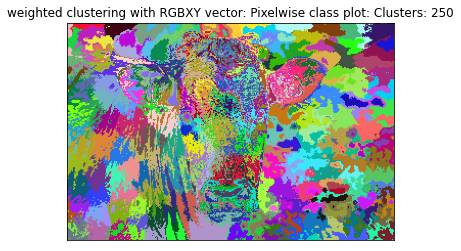

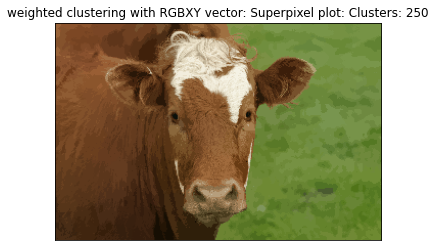

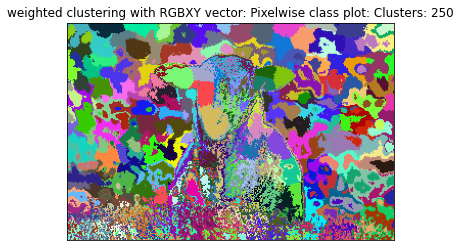

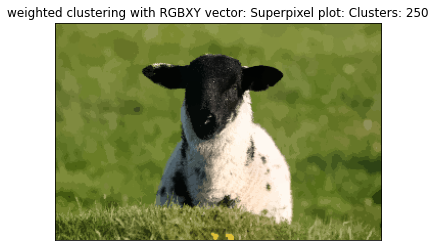

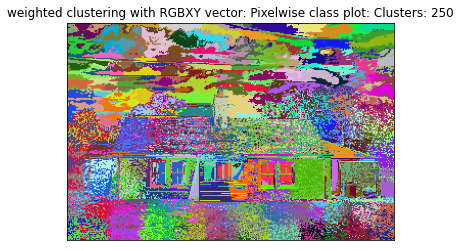

...

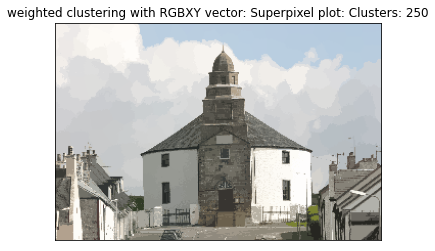

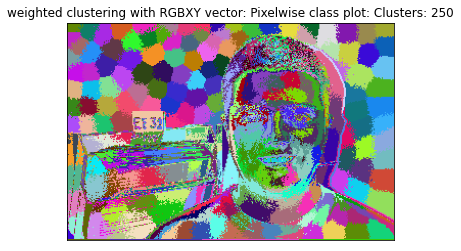

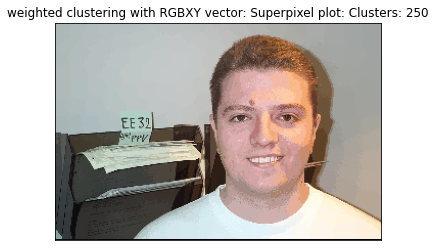

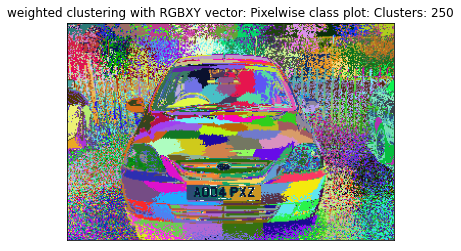

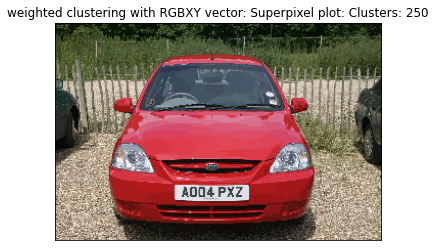

In [ ]:
#TODO: clustering r,b,g,x,y values with lambdas and display outputs
def cluster_rgbxy_with_weights(im,k, lambda_1, lambda_2):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    #assert 1==2,"NOT IMPLEMENTED"
    segmap = kmeans(im, k, clr_wt=lambda_1, pos_wt=lambda_2)
    return segmap


for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  k = 250
  clusters = cluster_rgbxy_with_weights(im, k=250, lambda_1=20, lambda_2=10)
  _ = rgb_segment(clusters,n = k, title =  "weighted clustering with RGBXY vector: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "weighted clustering with RGBXY vector: Superpixel plot: Clusters: "+ str(k))
  print('Clustering done for image:', i+1)


===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
===========<< Clusters:  250 : Iteration:  5  complete >>===========
===========<< Clusters:  250 : Iteration:  6  complete >>===========
===========<< Clusters:  250 : Iteration:  7  complete >>===========
===========<< Clusters:  250 : Iteration:  8  complete >>===========
===========<< Clusters:  250 : Iteration:  9  complete >>===========
===========<< Clusters:  250 : Iteration:  10  complete >>===========
Clustering done for image: 1
===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
====

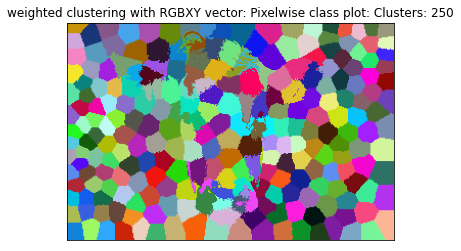

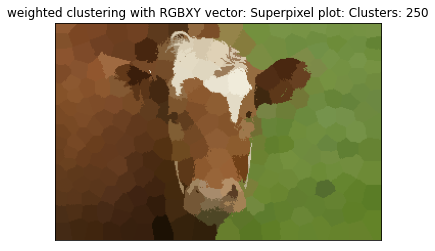

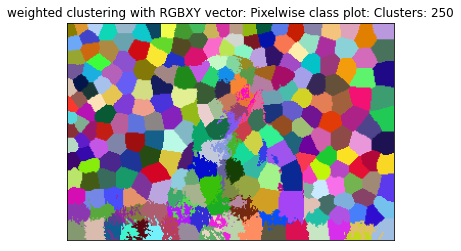

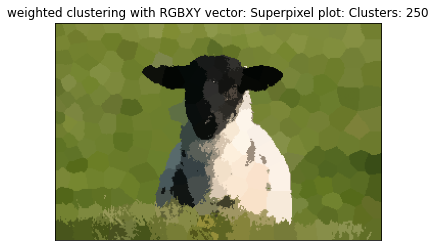

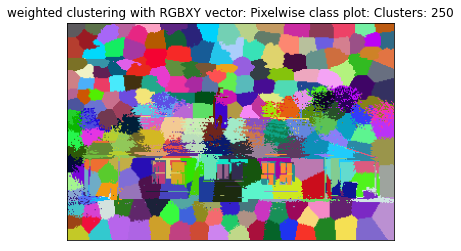

...

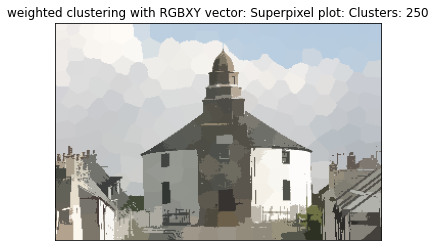

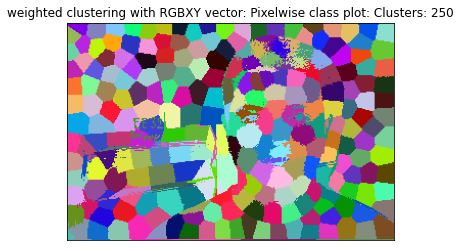

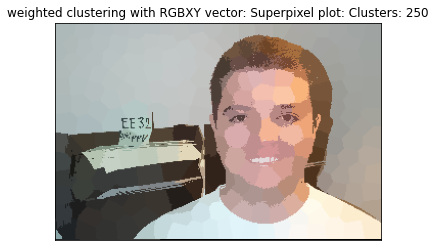

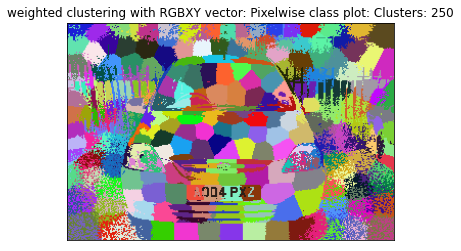

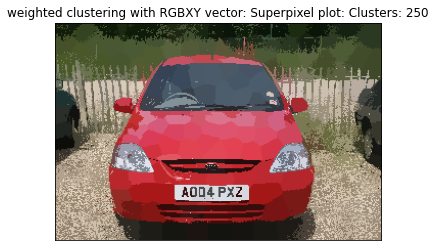

In [ ]:
##Testing with large value of lambda2 (ie weight of xy distance), we can see that it has ignored the color space and clustering has been done just based on proximity
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  k = 250
  clusters = cluster_rgbxy_with_weights(im, k=250, lambda_1=2, lambda_2=50)
  _ = rgb_segment(clusters,n = k, title =  "weighted clustering with RGBXY vector: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "weighted clustering with RGBXY vector: Superpixel plot: Clusters: "+ str(k))
  print('Clustering done for image:', i+1)

###Question 3: SLIC

It doesn't look like we have a very favourable outcome with superpixels simply being implemented as K-means. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.


__We are taking into account the normmalization of the spatial distances in the image as it depends upon the image size so that it does not neglect the distances in the color space (that is limited)__

__We can make the segments more compact and regular with almost equal number or pixels in each cluster.__

In [ ]:
def rgb_to_lab(img):
    img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB).astype(np.float64)
    return img_lab


def get_ind_pos_map(height, width):
    ind_pos_map = []
    for i in range(height):
        pos_list = []
        for j in range(width):
            pos_list.append([i,j])
        ind_pos_map.append(pos_list)
    return np.array(ind_pos_map)

In [ ]:
def init_clusters(im, height, width, k, S):
    cluster_list = []
    
    for i in range(S//2, height, S):
        for j in range(S//2, width, S):
            pixel_clr = im[i,j]
            cluster = Cluster(pixel_clr, np.array([i,j]))
            
            ## we can adjust the cluster center in this loop only:
            ## adjust the cluster centers to min local gradient
            align_to_min_local_gradient(im, height, width, cluster)
            
            cluster_list.append(cluster)
            
    return cluster_list

In [ ]:
def align_to_min_local_gradient(im, height, width, cluster):
    pos_y, pos_x = cluster.xy_center
    color_val = cluster.color_center
    
    min_grad = math.inf
    for i in range(pos_y-1, pos_y+2):
        for j in range(pos_x-1, pos_x+2):
            
            i, j = validate_point(height, width, i, j)
                
            gradient = get_gradient(im, j, i)
            
            if gradient < min_grad:
                min_grad = gradient
                cluster.xy_center = np.array([i, j])
                cluster.color_center = im[i, j]


def validate_point(height, width, y, x):
    if y < 0:
        y = 0 
    elif y >= height:
        y = height - 1
    if x < 0:
        x = 0 
    elif x >= width:
        x = width - 1
    
    return y, x
            
def get_gradient(im, x, y):
    vec1 = im[y+1, x] - im[y-1, x]
    vec2 = im[y, x+1] - im[y, x-1]
    gradient = (np.linalg.norm(vec1)**2 + np.linalg.norm(vec2)**2)
    return gradient
        
    

In [ ]:
def assign_pixels_to_clusters(im, height, width, clusters, m, S, distance_map, seg_map):
    for c_ind, cluster in enumerate(clusters):
        pos_y, pos_x = cluster.xy_center
        pos_y, pos_x = int(pos_y), int(pos_x)
        for i in range(pos_y-S, pos_y+S):
            for j in range(pos_x-S, pos_x+S):
                
                i, j = validate_point(height, width, i, j)
                
                pixel_color = im[i,j]
                curr_pixel = Pixel(pixel_color, np.array([i,j]))

                centroid_pix = Pixel(cluster.color_center, cluster.xy_center)
                dist = weighted_distance(curr_pixel, centroid_pix, clr_wt=(1/S)**2, pos_wt=(1/m)**2)

                if dist < distance_map[i,j]:
                    distance_map[i,j] = dist
                    seg_map[i,j] = c_ind + 1


def adjust_cluster_centers(im, clusters, seg_map, ind_pos_map):
    for c_ind, cluster in enumerate(clusters):
        match_idx = (seg_map == (c_ind+1))
        
        pixels_in_cluster_lab = im[match_idx]
        pixels_in_cluster_yx = ind_pos_map[match_idx]
        
        color_mean = pixels_in_cluster_lab.mean(axis=0)
        pos_mean = pixels_in_cluster_yx.mean(axis=0)
        
        cluster.color_center = color_mean
        cluster.xy_center = pos_mean
        

In [ ]:
def is_valid_point(ht, wd, pt):
    y, x = pt
    return (0 <= y < ht) and (0 <= x < wd)

def get_nearest_label(height, width, pix_pos, adj_shift, new_seg_map, nearest_label):
    #check for a labelled pixel to assign if the superpixel size < min_area
    for shift in adj_shift:
        neighbor_pix = tuple(np.array(pix_pos) + shift)
        if is_valid_point(height, width, neighbor_pix):
            if new_seg_map[neighbor_pix] >=0:
                nearest_label = new_seg_map[neighbor_pix]
                break
    return nearest_label

#### Code to enforce connectivity after getting the superpixels.
Enforce connectivity: There are many superpixels which are very small and disconnected from each other. We need to merge them with larger superpixels.
We are re-labeling the pixels in this function.
- a new segement map is defined.
- BFS algo is used to find a group of same labels.
- If the number of pixels in a group is less than the limit than a nearby label is assigned to all those pixels.

In [ ]:
'''
We are re-labeling the pixels in this function.
1) a new segement map is defined
2) BFS algo is used to find a group of same labels
3) If the number of pixels in a group is less than the limit than a nearby label is assigned to all those pixels

'''

def enforce_connectivity(height, width, seg_map, min_area):
    new_seg_map = -1*np.ones((height,width))
    
    new_cluster_id = 0  # for the new_seg_map
    nearest_label = 0
    
    adj_shift = np.array([[0,1],[0,-1],[1,0],[-1,0]])    
    
    pix_cluster = []
    min_area = int(min_area)
    for i in range(height):
        for j in range(width):
            pix_curr_label = seg_map[i, j]
            
            # find a pixel yet not labelled in the new seg map
            if new_seg_map[i, j] == -1:
                
                #start checking for same neighbouring pixel labels - simple BFS
                
                pix_cluster = []
                pix_cluster.append((i, j))
                visited_pix = set()
                
                
                while len(pix_cluster) != 0:
                    pix = pix_cluster.pop(0)
                    visited_pix.add(pix)
                    for shift in adj_shift:
                        neighbor_pix = tuple(np.array(pix) + shift)
                        if is_valid_point(height, width, neighbor_pix):
                            
                            # if adj pixel is unlabelled then label it:
                            if (new_seg_map[neighbor_pix] == -1 and (seg_map[neighbor_pix] == pix_curr_label)):
                                pix_cluster.append(neighbor_pix)
                                new_seg_map[neighbor_pix] = new_cluster_id
                                
                curr_area = len(visited_pix)              
                # re-label if the curr_area (i.e the number of pixels in the cluster) is less than the min_area:
                if curr_area < min_area >> 2:
                    nearest_label = get_nearest_label(height, width, (i, j), adj_shift, new_seg_map, nearest_label)
                    for pix in visited_pix:
                        new_seg_map[pix] = nearest_label
    
                else:
                    new_cluster_id += 1
                
    return new_seg_map
                    
                    

In [ ]:
def slic_seg(im_rgb, k, is_enforce_connectivity, m=10, num_iter=10):
    
    im = rgb_to_lab(im_rgb)
    MAX_NUM = math.inf
    height, width = im.shape[0], im.shape[1]
    
    seg_map = -1 * np.ones((height, width))
    distance_map =  MAX_NUM * np.ones((height, width))
    ind_pos_map = get_ind_pos_map(height, width)
    
    N = im.shape[0]*im.shape[1]  # total_num_pixels
    area_super_pixel = N/k
    S = int(math.sqrt(area_super_pixel))
    
    clusters = init_clusters(im, height, width, k, S)
    
    itr = 0
    while itr < num_iter:
        assign_pixels_to_clusters(im, height, width, clusters, m, S, distance_map, seg_map)
        
        adjust_cluster_centers(im, clusters, seg_map, ind_pos_map)
        
        itr += 1
        print('===========<< Clusters: ', k, ': Iteration: ', itr, ' complete >>===========')
        
        # repeat
    if is_enforce_connectivity:
      print('Enforcinng Connectivity')
      seg_map = enforce_connectivity(height, width, seg_map, area_super_pixel)
    
    return seg_map

In [ ]:

############ Algorithm ############
# Compute grid steps: S
# explore different values of m
# initialize cluster centers [l,a,b,x,y] using  
# Perturb for minimum G
# while not converged
# for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S. 
####  Assign to nearest cluster
##calculate new cluster center 
 

def SLIC(im, k, is_enforce_connectivity):
    """
    Input arguments: 
    im: image input
    k: number of cluster segments


    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..
    
    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """
    segmap = slic_seg(im, k, is_enforce_connectivity, m=10, num_iter=10)
    return segmap


===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
===========<< Clusters:  100 : Iteration:  4  complete >>===========
===========<< Clusters:  100 : Iteration:  5  complete >>===========
===========<< Clusters:  100 : Iteration:  6  complete >>===========
===========<< Clusters:  100 : Iteration:  7  complete >>===========
===========<< Clusters:  100 : Iteration:  8  complete >>===========
===========<< Clusters:  100 : Iteration:  9  complete >>===========
===========<< Clusters:  100 : Iteration:  10  complete >>===========
Superpixel Clustering done for image without enforcing connectivity:  1
===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
===========<< Clusters:  100 :

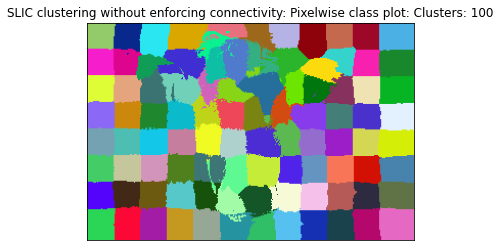

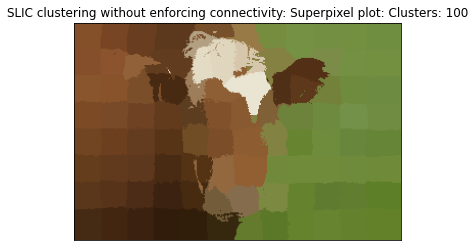

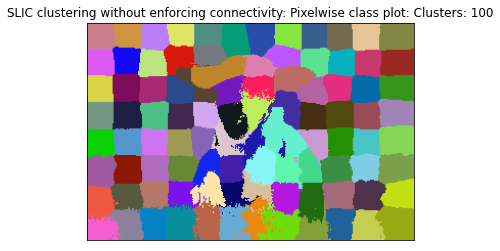

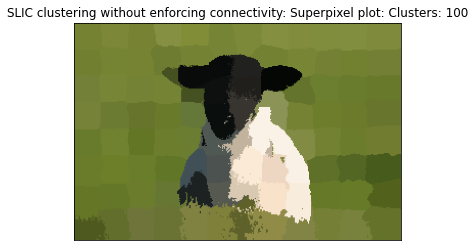

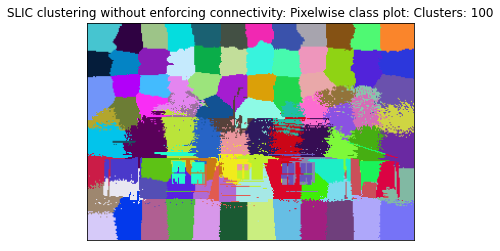

...

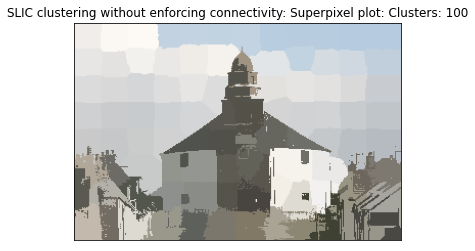

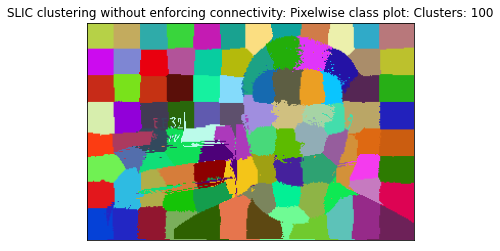

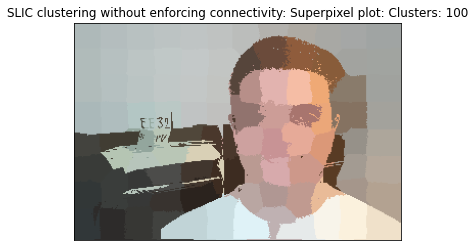

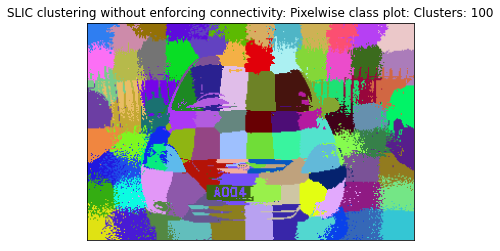

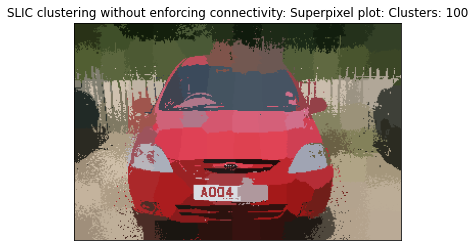

In [ ]:

k=100
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  clusters = SLIC(im, k, False)  # is_enforce_connectivity=False
  _ = rgb_segment(clusters,n = k, title =  "SLIC clustering without enforcing connectivity: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "SLIC clustering without enforcing connectivity: Superpixel plot: Clusters: "+ str(k))
  print('Superpixel Clustering done for image without enforcing connectivity: ', i+1)
  

## Enforcing Connectivity:
Enforce connectivity: There are many superpixels which are very small and disconnected from each other. Try to merge them with larger superpixels

O(N) algorithm:
1. Set a minimum size of superpixel
2. If the area of a region is smaller than a threshold, we assign it to the nearest cluster 


===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
===========<< Clusters:  100 : Iteration:  4  complete >>===========
===========<< Clusters:  100 : Iteration:  5  complete >>===========
===========<< Clusters:  100 : Iteration:  6  complete >>===========
===========<< Clusters:  100 : Iteration:  7  complete >>===========
===========<< Clusters:  100 : Iteration:  8  complete >>===========
===========<< Clusters:  100 : Iteration:  9  complete >>===========
===========<< Clusters:  100 : Iteration:  10  complete >>===========
Enforcinng Connectivity
Superpixel Clustering done for image with enforcing connectivity:  1
===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
=========

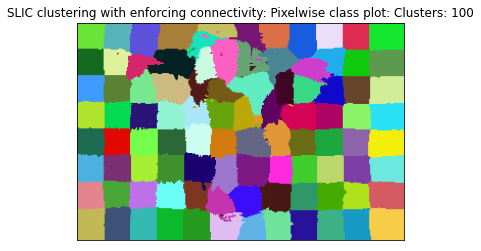

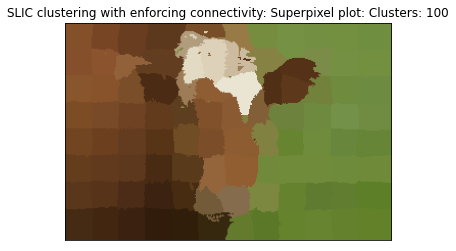

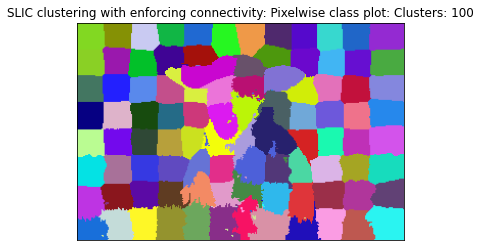

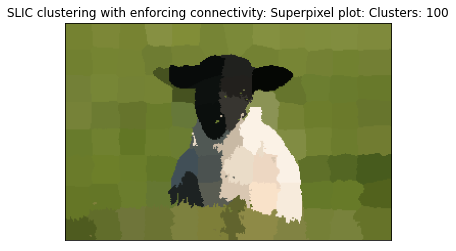

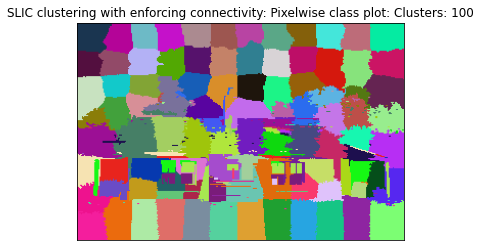

...

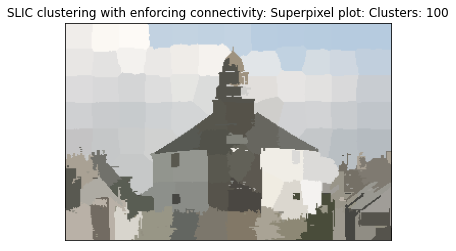

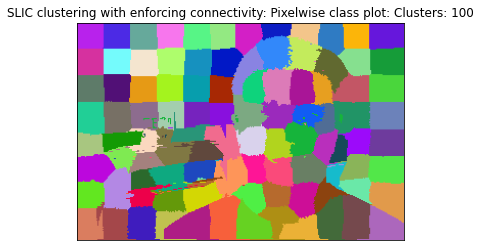

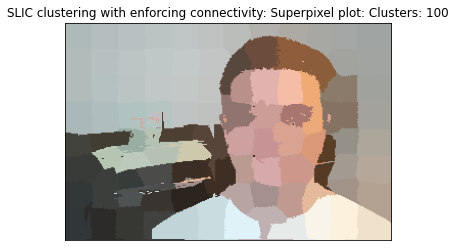

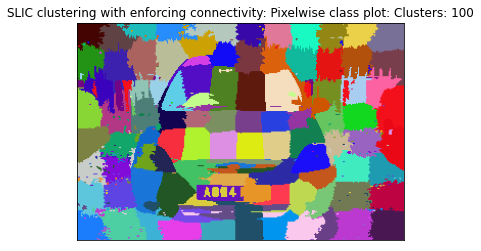

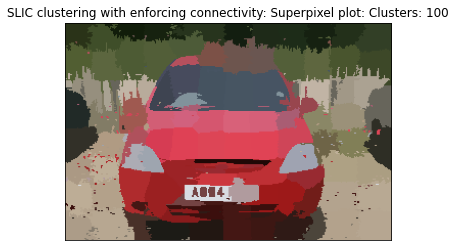

In [ ]:

k=100
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  clusters = SLIC(im, k, True)  # is_enforce_connectivity=True
  _ = rgb_segment(clusters,n = k, title =  "SLIC clustering with enforcing connectivity: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "SLIC clustering with enforcing connectivity: Superpixel plot: Clusters: "+ str(k))
  print('Superpixel Clustering done for image with enforcing connectivity: ', i+1)
  

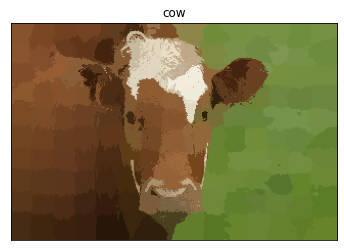

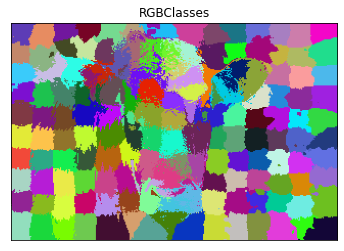

In [ ]:
#TODO diplay your SLIC results

## Your File
Link to your colab/ipynb file: **Insert google drive/colab link here**
